# Import libraries

In [ ]:
import torch
from torchvision import datasets, transforms
import torch.nn as nn
import torch.optim as optim
from torchsummary import summary
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader, random_split, TensorDataset
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from tqdm import tqdm
import optuna
import joblib
import os

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Question 1
> Write code that allows you to construct a dataset which combines the images and provides the appropriate labels. The input images should be of shape 56 × 28. Generate appropriate training, validation, and test datasets. Justify your choices in the generation of these datasets, i.e. ensure that the appropriate statistical properties are guaranteed.

## Prepare dataset

In [2]:
train_dataset = datasets.MNIST('./data', train=True, download=True, transform=transforms.ToTensor())
test_dataset = datasets.MNIST('./data', train=False, transform=transforms.ToTensor())

In [3]:
print(f"The image in training set has shape: {train_dataset[0][0].shape}")

The image in training set has shape: torch.Size([1, 28, 28])


In [ ]:
def data_converter(dataset, num_pairs=100000):
    '''This function converts the MNIST dataset into a dataset with pairs of handwritten digits'''
    data_pair = []
    labels = []
    dataset_len = len(dataset)

    for _ in range(num_pairs):
        idx1, idx2 = torch.randint(0, dataset_len, (1,)).item(), torch.randint(0, dataset_len, (1,)).item()
        img1, label1 = dataset[idx1]
        img2, label2 = dataset[idx2]

        combined_image = torch.cat((img1, img2), dim=1) # Shape: 1 * 56 * 28
        combined_label = label1 + label2

        data_pair.append(combined_image) 
        labels.append(combined_label)
    
    return data_pair, labels

trainset_pair, trainset_labels = data_converter(train_dataset, num_pairs=100000)

train_image_pair, temp_image_pair, train_label_pair, temp_label_pair = train_test_split(
    trainset_pair, trainset_labels, test_size=0.3, random_state=8
)

val_image_pair, test_image_pair, val_label_pair, test_label_pair = train_test_split(
    temp_image_pair, temp_label_pair, test_size=0.5, random_state=8
)

## Visualise dataset

Each image in dataset has shape: torch.Size([56, 28])
View an example of an image:
Label: 9


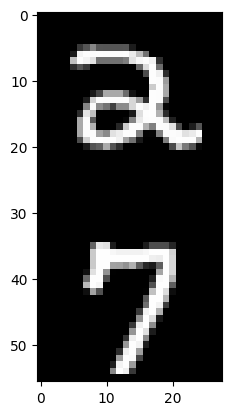

In [82]:
print(f"Each image in dataset has shape: {train_image_pair[0][0].shape}")
print(f"View an example of an image:")
print(f"Label: {train_label_pair[0]}")
plt.imshow(train_image_pair[0][0], cmap='gray')
plt.show()

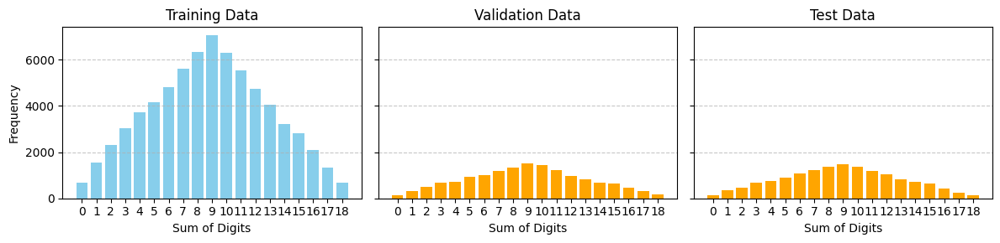

In [ ]:
# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 3), sharey=True)

# Training dataset histogram
axes[0].hist(train_label_pair, bins=range(0, 20), align='left', rwidth=0.8, color='skyblue')
axes[0].set_xticks(range(0, 19))
axes[0].set_xlabel("Sum of Digits")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Training Data")
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# validation dataset histogram
axes[1].hist(val_label_pair, bins=range(0, 20), align='left', rwidth=0.8, color='orange')
axes[1].set_xticks(range(0, 19))
axes[1].set_xlabel("Sum of Digits")
axes[1].set_title("Validation Data")
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Test dataset histogram
axes[2].hist(test_label_pair, bins=range(0, 20), align='left', rwidth=0.8, color='orange')
axes[2].set_xticks(range(0, 19))
axes[2].set_xlabel("Sum of Digits")
axes[2].set_title("Test Data")
axes[2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()

--------------

# Question 2
> Using these datasets, develop a neural network pipeline using fully connected neural networks which allows you to address this inference/classification process. The output of your neural network can correspond to a single number, e.g. 7 + 3 = 10. You should perform some hyper-parameter tuning to establish a good architecture (a choice of five hyper-parameters is what we look for and you should restrict the number of experiments that you can run them on a personal laptop using no more than a few hours). Your report should include a short overview of the results you have obtained in this hyper-parameter search. You should provide the weights of your best performing neural network and the neural networks utilised in plots (i.e. the plots should be reproducible).


## Model construction

In [7]:
# Hyperparameters
input_size = 56 * 28  # Flattened image size
hidden_layers_trial = [512, 256]  # Number of neurons in hidden layers
learning_rate_trial = 0.001
batch_size_trial = 64
dropout_rate_trial = 0.2
activation_func_trial = nn.ReLU()
output_size = 19  # Output is sum of two digits, range: 0-18
epochs = 25

# Loss function for multi-class classification
criterion = nn.CrossEntropyLoss()

In [60]:
# Define the fully-connected neural network model
class FCNN(nn.Module):
    def __init__(self, input_size, hidden_layers, output_size, dropout_rate, activation_func):
        super(FCNN, self).__init__()
        layers = []
        prev_size = input_size

        for hidden_size in hidden_layers: # Iterates through each value in hidden_layers to define the hidden layers
            layers.append(nn.Linear(prev_size, hidden_size)) # Adds a fully connected layer that maps prev_size inputs to hidden_size outputs
            layers.append(activation_func)  # Use the chosen activation function
            layers.append(nn.Dropout(dropout_rate))  # Dropout for regularization
            prev_size = hidden_size # Updates prev_size to the size of the current hidden layer to use as the input size for the next layer

        layers.append(nn.Linear(prev_size, output_size)) # final fully connected layer that maps the last hidden layer's size (prev_size) to the output_size
        self.network = nn.Sequential(*layers) # Combines all the layers into a single sequential block that executes them in order. 
                                              # * unpacks the list of layers

    def forward(self, x):
        return self.network(x)
    
    def extract_embeddings(self, x):
        """
        Extract embeddings after the last hidden layer (before the final output layer) for Question 5.
        The method returns the activations from the last hidden layer.

        Parameters:
        - x: The input tensor to the network.

        Returns:
        - The embeddings (feature map) after the last hidden layer.
        """
        # Pass through all layers except for the final output layer
        for layer in self.network[:-1]:  # Exclude the last layer (the output layer)
            x = layer(x)  # Pass input through each layer sequentially
        return x  # Return the output of the last hidden layer (before the final output layer)

In [9]:
# Create Datasets and Dataloaders
def prepare_dataloader(images, labels, batch_size):
    '''
        inputs: 
        images: a list of images, with each image having a shape of (1,56,28) (grayscale, height, width);
        labels: a list of labels corresponding to the images, all integer numbers;
        batch_size: the number of samples per batch for the DataLoader.
    '''
    images = torch.stack(images)# Converts the list of images into a single PyTorch tensor.
                                # Shape: (num_samples, 1, 56, 28)
    labels = torch.tensor(labels) # Converts the list of labels into a PyTorch tensor.
                                  # Shape: (num_samples,)
    images = images.view(images.size(0), -1) # Flatten images to shape (num_samples, 56*28) to pass it to FCNN
    dataset = TensorDataset(images, labels) # pairs input tensors (images) with their labels (labels)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

train_loader = prepare_dataloader(train_image_pair, train_label_pair, batch_size_trial)
val_loader = prepare_dataloader(val_image_pair, val_label_pair, batch_size_trial)
test_loader = prepare_dataloader(test_image_pair, test_label_pair, batch_size_trial)

FCNN layers at initialization: Sequential(
  (0): Linear(in_features=1568, out_features=512, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.2, inplace=False)
  (3): Linear(in_features=512, out_features=256, bias=True)
  (4): ReLU()
  (5): Dropout(p=0.2, inplace=False)
  (6): Linear(in_features=256, out_features=19, bias=True)
)


[train] epoch: 0: 100%|██████████| 1094/1094 [00:09<00:00, 109.62it/s]


Epoch 1/25, Train Loss: 1.3951, Val Loss: 0.7072, Train Accuracy: 54.41%, Val Accuracy: 78.85%


[train] epoch: 1: 100%|██████████| 1094/1094 [00:06<00:00, 164.48it/s]


Epoch 2/25, Train Loss: 0.6680, Val Loss: 0.5051, Train Accuracy: 79.63%, Val Accuracy: 84.98%


[train] epoch: 2: 100%|██████████| 1094/1094 [00:06<00:00, 166.80it/s]


Epoch 3/25, Train Loss: 0.4860, Val Loss: 0.4022, Train Accuracy: 85.56%, Val Accuracy: 88.07%


[train] epoch: 3: 100%|██████████| 1094/1094 [00:07<00:00, 138.71it/s]


Epoch 4/25, Train Loss: 0.3853, Val Loss: 0.3656, Train Accuracy: 88.36%, Val Accuracy: 89.54%


[train] epoch: 4: 100%|██████████| 1094/1094 [00:06<00:00, 172.20it/s]


Epoch 5/25, Train Loss: 0.3252, Val Loss: 0.3201, Train Accuracy: 90.18%, Val Accuracy: 90.93%


[train] epoch: 5: 100%|██████████| 1094/1094 [00:06<00:00, 173.05it/s]


Epoch 6/25, Train Loss: 0.2736, Val Loss: 0.3026, Train Accuracy: 91.68%, Val Accuracy: 91.40%


[train] epoch: 6: 100%|██████████| 1094/1094 [00:06<00:00, 174.23it/s]


Epoch 7/25, Train Loss: 0.2457, Val Loss: 0.2891, Train Accuracy: 92.55%, Val Accuracy: 91.81%


[train] epoch: 7: 100%|██████████| 1094/1094 [00:07<00:00, 152.67it/s]


Epoch 8/25, Train Loss: 0.2183, Val Loss: 0.2641, Train Accuracy: 93.35%, Val Accuracy: 92.80%


[train] epoch: 8: 100%|██████████| 1094/1094 [00:06<00:00, 172.11it/s]


Epoch 9/25, Train Loss: 0.1932, Val Loss: 0.2771, Train Accuracy: 94.00%, Val Accuracy: 92.53%


[train] epoch: 9: 100%|██████████| 1094/1094 [00:07<00:00, 149.24it/s]


Epoch 10/25, Train Loss: 0.1810, Val Loss: 0.2614, Train Accuracy: 94.38%, Val Accuracy: 92.97%


[train] epoch: 10: 100%|██████████| 1094/1094 [00:08<00:00, 125.60it/s]


Epoch 11/25, Train Loss: 0.1631, Val Loss: 0.2521, Train Accuracy: 94.89%, Val Accuracy: 93.26%


[train] epoch: 11: 100%|██████████| 1094/1094 [00:06<00:00, 165.39it/s]


Epoch 12/25, Train Loss: 0.1558, Val Loss: 0.2527, Train Accuracy: 95.19%, Val Accuracy: 93.57%


[train] epoch: 12: 100%|██████████| 1094/1094 [00:06<00:00, 170.72it/s]


Epoch 13/25, Train Loss: 0.1468, Val Loss: 0.2564, Train Accuracy: 95.47%, Val Accuracy: 93.36%


[train] epoch: 13: 100%|██████████| 1094/1094 [00:06<00:00, 166.87it/s]


Epoch 14/25, Train Loss: 0.1368, Val Loss: 0.2456, Train Accuracy: 95.80%, Val Accuracy: 93.69%


[train] epoch: 14: 100%|██████████| 1094/1094 [00:07<00:00, 152.64it/s]


Epoch 15/25, Train Loss: 0.1300, Val Loss: 0.2660, Train Accuracy: 95.94%, Val Accuracy: 93.52%


[train] epoch: 15: 100%|██████████| 1094/1094 [00:06<00:00, 167.06it/s]


Epoch 16/25, Train Loss: 0.1239, Val Loss: 0.2688, Train Accuracy: 96.11%, Val Accuracy: 93.24%


[train] epoch: 16: 100%|██████████| 1094/1094 [00:06<00:00, 167.97it/s]


Epoch 17/25, Train Loss: 0.1216, Val Loss: 0.2594, Train Accuracy: 96.20%, Val Accuracy: 93.63%


[train] epoch: 17: 100%|██████████| 1094/1094 [00:06<00:00, 166.70it/s]


Epoch 18/25, Train Loss: 0.1130, Val Loss: 0.2613, Train Accuracy: 96.47%, Val Accuracy: 93.71%


[train] epoch: 18: 100%|██████████| 1094/1094 [00:06<00:00, 174.18it/s]


Epoch 19/25, Train Loss: 0.1118, Val Loss: 0.2626, Train Accuracy: 96.47%, Val Accuracy: 93.81%


[train] epoch: 19: 100%|██████████| 1094/1094 [00:06<00:00, 158.18it/s]


Epoch 20/25, Train Loss: 0.1088, Val Loss: 0.2617, Train Accuracy: 96.66%, Val Accuracy: 93.97%


[train] epoch: 20: 100%|██████████| 1094/1094 [00:06<00:00, 167.68it/s]


Epoch 21/25, Train Loss: 0.1024, Val Loss: 0.2604, Train Accuracy: 96.80%, Val Accuracy: 94.35%


[train] epoch: 21: 100%|██████████| 1094/1094 [00:06<00:00, 171.34it/s]


Epoch 22/25, Train Loss: 0.1064, Val Loss: 0.2780, Train Accuracy: 96.77%, Val Accuracy: 93.89%


[train] epoch: 22: 100%|██████████| 1094/1094 [00:06<00:00, 163.29it/s]


Epoch 23/25, Train Loss: 0.0998, Val Loss: 0.2593, Train Accuracy: 96.89%, Val Accuracy: 94.26%


[train] epoch: 23: 100%|██████████| 1094/1094 [00:06<00:00, 171.03it/s]


Epoch 24/25, Train Loss: 0.0973, Val Loss: 0.2635, Train Accuracy: 97.08%, Val Accuracy: 94.27%


[train] epoch: 24: 100%|██████████| 1094/1094 [00:06<00:00, 168.88it/s]


Epoch 25/25, Train Loss: 0.0963, Val Loss: 0.2569, Train Accuracy: 97.08%, Val Accuracy: 94.33%


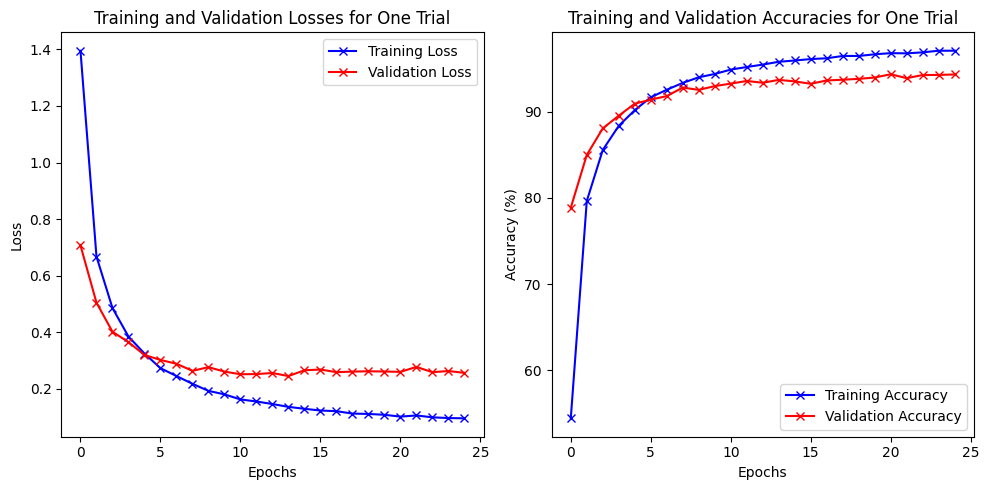

In [ ]:
# Training loop for one trial
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs):
    trial_train_losses = []  # Store training losses
    trial_val_losses = []  # Store validation losses
    trial_train_accuracies = []  # Store training accuracies
    trial_val_accuracies = []  # Store validation accuracies

    for epoch in range(epochs):
        # Train the model
        model.train()
        train_loss = 0
        correct_train = 0
        total_train = 0
        for images, labels in tqdm(train_loader, desc=f'[train] epoch: {epoch}'):
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

            # Calculate training accuracy
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()
        
        # Validation step
        val_loss = 0
        correct_val = 0
        total_val = 0
        model.eval()
        with torch.no_grad(): # operations won't track gradients to speed up process
            for images, labels in val_loader:
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                # Calculate validation accuracy
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()
        
        # Calculate and store accuracy for this epoch
        train_accuracy = 100 * correct_train / total_train
        val_accuracy = 100 * correct_val / total_val

        # Append losses and accuracies
        trial_train_losses.append(train_loss / len(train_loader))
        trial_val_losses.append(val_loss / len(val_loader))
        trial_train_accuracies.append(train_accuracy)
        trial_val_accuracies.append(val_accuracy)

        print(f"Epoch {epoch+1}/{epochs}, "
              f"Train Loss: {train_loss/len(train_loader):.4f}, "
              f"Val Loss: {val_loss/len(val_loader):.4f}, "
              f"Train Accuracy: {train_accuracy:.2f}%, "
              f"Val Accuracy: {val_accuracy:.2f}%")
        
    # Plot the training and validation loss curves
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1) # plot on the left side
    plt.plot(range(epochs), trial_train_losses, label='Training Loss', color='blue', marker='x', markersize=6)
    plt.plot(range(epochs), trial_val_losses, label='Validation Loss', color='red', marker='x', markersize=6)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses')
    plt.legend()

    # Plot the training and validation accuracy curves
    plt.subplot(1, 2, 2)  # Plot on the right side
    plt.plot(range(epochs), trial_train_accuracies, label='Training Accuracy', color='blue', marker='x', markersize=6)
    plt.plot(range(epochs), trial_val_accuracies, label='Validation Accuracy', color='red', marker='x', markersize=6)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.title('Training and Validation Accuracies')
    plt.legend()

    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()
    
model_trial = FCNN(input_size, hidden_layers_trial, output_size, dropout_rate_trial, activation_func_trial)
optimizer_trial = optim.Adam(model_trial.parameters(), lr=learning_rate_trial)

train_model(model_trial, train_loader, val_loader, criterion, optimizer_trial, epochs)

In [11]:
# Display the model summary
summary(model_trial, (1, 56*28), batch_size=batch_size_trial)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1               [64, 1, 512]         803,328
              ReLU-2               [64, 1, 512]               0
           Dropout-3               [64, 1, 512]               0
            Linear-4               [64, 1, 256]         131,328
              ReLU-5               [64, 1, 256]               0
           Dropout-6               [64, 1, 256]               0
            Linear-7                [64, 1, 19]           4,883
Total params: 939,539
Trainable params: 939,539
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.38
Forward/backward pass size (MB): 1.13
Params size (MB): 3.58
Estimated Total Size (MB): 5.10
----------------------------------------------------------------


In [12]:
# Test the model
def test_model(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in test_loader:
            outputs = model(images)
            _, preds = torch.max(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    accuracy = accuracy_score(all_labels, all_preds)
    print(f"Test Accuracy: {accuracy:.4f}")

test_model(model_trial, test_loader)

Test Accuracy: 0.9419


## Hyperparameter tuning

In [ ]:
# Define the objective function
def objective(trial):
    # Perform hyperparameter tuning on 5 hyper-parameters
    hidden_layers = trial.suggest_categorical('hidden_layers', [[128, 64], [256, 128], [512, 256, 128], [512, 256, 128, 64]])
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.4)
    activation_name = trial.suggest_categorical('activation', ['ReLU', 'Tanh', 'Sigmoid'])
    epochs = 20  # Fixed to limit runtime

    # Map activation names to PyTorch functions
    activation_func = {
        'ReLU': nn.ReLU(),
        'Tanh': nn.Tanh(),
        'Sigmoid': nn.Sigmoid()
    }[activation_name]

    model = FCNN(input_size=56 * 28, hidden_layers=hidden_layers, output_size=19, dropout_rate=dropout_rate, activation_func=activation_func)

    # Prepare DataLoader
    train_loader = prepare_dataloader(train_image_pair, train_label_pair, batch_size)
    val_loader = prepare_dataloader(val_image_pair, val_label_pair, batch_size)

    # Define criterion and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Training loop
    model.to('cpu')
    best_val_loss = float('inf')
    best_model_weights = None  # Placeholder for saving the best model's state_dict

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for batch_images, batch_labels in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_images)
            loss = criterion(outputs, batch_labels.long())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for val_images, val_labels in val_loader:
                outputs = model(val_images)
                loss = criterion(outputs, val_labels.long())
                val_loss += loss.item()
        val_loss /= len(val_loader)

        # Save the best model weights if this is the best validation loss so far
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_weights = model.state_dict()  # Save the state_dict of the model
        
    # Save the best model weights during the run
    torch.save(best_model_weights, "best_model_weights_5params.pth")
    return best_val_loss  # Optuna minimizes this

In [61]:
# Check if the study and model weights files exist
if not os.path.exists('optuna_study_5params.pkl'):
    # If the files do not exist, run the optimization
    print("Running the optimization process...")

    # Create a study and optimize the objective function
    study = optuna.create_study(direction='minimize')

    # Use tqdm to wrap the study.optimize() loop
    with tqdm(total=50, desc="Optimizing Hyperparameters", unit="trial") as pbar:
        def callback(study, trial):
            # Update the progress bar with each completed trial
            pbar.update(1)

        # Start optimization with the progress bar callback
        study.optimize(objective, n_trials=50, callbacks=[callback])

    # Save the study using joblib
    joblib.dump(study, "optuna_study_5params.pkl")
    print("Study saved to 'optuna_study_5params.pkl'")

    # Print the best trial
    print("Best trial:")
    print(f"  Value (best validation loss): {study.best_trial.value}")
    print(f"  Params: {study.best_trial.params}")
else:
    # If the files already exist, skip the optimization
    print("Optimization already done. Skipping the optimization process.")

    # Load the previously saved study and best model weights
    study = joblib.load("optuna_study_5params.pkl")
    print("Study loaded from 'optuna_study_5params.pkl'")

    activation_dict_from_tuning = {
        'ReLU': nn.ReLU(),
        'Tanh': nn.Tanh(),
        'Sigmoid': nn.Sigmoid()
    }

    get_activation_func = activation_dict_from_tuning.get(study.best_params['activation'], nn.ReLU())  # Default to nn.ReLU if not found

    # Load the best model weights
    best_model = FCNN(input_size=56 * 28, hidden_layers=study.best_params['hidden_layers'],
                  output_size=19, dropout_rate=study.best_params['dropout_rate'],
                  activation_func=get_activation_func)
    best_model.eval()

    print("Best model weights loaded from 'best_model_weights_5params.pth'")

    print("Best hyperparameters:", study.best_params)

Optimization already done. Skipping the optimization process.
Study loaded from 'optuna_study_5params.pkl'
Best model weights loaded from 'best_model_weights_5params.pth'
Best hyperparameters: {'hidden_layers': [512, 256, 128, 64], 'learning_rate': 0.000633489537397628, 'batch_size': 64, 'dropout_rate': 0.17439213235063694, 'activation': 'ReLU'}


## Analyze the best model

[train] epoch: 0: 100%|██████████| 1094/1094 [00:09<00:00, 119.30it/s]


Epoch 1/25, Train Loss: 1.9002, Val Loss: 1.0099, Train Accuracy: 34.14%, Val Accuracy: 69.57%


[train] epoch: 1: 100%|██████████| 1094/1094 [00:07<00:00, 141.67it/s]


Epoch 2/25, Train Loss: 0.8333, Val Loss: 0.5147, Train Accuracy: 75.57%, Val Accuracy: 85.52%


[train] epoch: 2: 100%|██████████| 1094/1094 [00:07<00:00, 143.57it/s]


Epoch 3/25, Train Loss: 0.5487, Val Loss: 0.4118, Train Accuracy: 84.74%, Val Accuracy: 88.65%


[train] epoch: 3: 100%|██████████| 1094/1094 [00:07<00:00, 147.74it/s]


Epoch 4/25, Train Loss: 0.4191, Val Loss: 0.3366, Train Accuracy: 88.44%, Val Accuracy: 90.59%


[train] epoch: 4: 100%|██████████| 1094/1094 [00:08<00:00, 124.72it/s]


Epoch 5/25, Train Loss: 0.3419, Val Loss: 0.3018, Train Accuracy: 90.52%, Val Accuracy: 91.79%


[train] epoch: 5: 100%|██████████| 1094/1094 [00:08<00:00, 131.52it/s]


Epoch 6/25, Train Loss: 0.2889, Val Loss: 0.2886, Train Accuracy: 92.04%, Val Accuracy: 92.35%


[train] epoch: 6: 100%|██████████| 1094/1094 [00:09<00:00, 116.62it/s]


Epoch 7/25, Train Loss: 0.2516, Val Loss: 0.2857, Train Accuracy: 93.00%, Val Accuracy: 92.55%


[train] epoch: 7: 100%|██████████| 1094/1094 [00:08<00:00, 126.48it/s]


Epoch 8/25, Train Loss: 0.2238, Val Loss: 0.2629, Train Accuracy: 93.70%, Val Accuracy: 93.09%


[train] epoch: 8: 100%|██████████| 1094/1094 [00:07<00:00, 144.33it/s]


Epoch 9/25, Train Loss: 0.2024, Val Loss: 0.2461, Train Accuracy: 94.35%, Val Accuracy: 93.26%


[train] epoch: 9: 100%|██████████| 1094/1094 [00:08<00:00, 122.67it/s]


Epoch 10/25, Train Loss: 0.1801, Val Loss: 0.2423, Train Accuracy: 94.96%, Val Accuracy: 93.64%


[train] epoch: 10: 100%|██████████| 1094/1094 [00:08<00:00, 125.78it/s]


Epoch 11/25, Train Loss: 0.1644, Val Loss: 0.2358, Train Accuracy: 95.26%, Val Accuracy: 94.08%


[train] epoch: 11: 100%|██████████| 1094/1094 [00:09<00:00, 117.58it/s]


Epoch 12/25, Train Loss: 0.1554, Val Loss: 0.2355, Train Accuracy: 95.57%, Val Accuracy: 94.21%


[train] epoch: 12: 100%|██████████| 1094/1094 [00:08<00:00, 131.64it/s]


Epoch 13/25, Train Loss: 0.1405, Val Loss: 0.2395, Train Accuracy: 95.95%, Val Accuracy: 94.37%


[train] epoch: 13: 100%|██████████| 1094/1094 [00:08<00:00, 131.51it/s]


Epoch 14/25, Train Loss: 0.1324, Val Loss: 0.2317, Train Accuracy: 96.25%, Val Accuracy: 94.39%


[train] epoch: 14: 100%|██████████| 1094/1094 [00:09<00:00, 111.67it/s]


Epoch 15/25, Train Loss: 0.1260, Val Loss: 0.2217, Train Accuracy: 96.31%, Val Accuracy: 94.58%


[train] epoch: 15: 100%|██████████| 1094/1094 [00:09<00:00, 111.83it/s]


Epoch 16/25, Train Loss: 0.1154, Val Loss: 0.2252, Train Accuracy: 96.63%, Val Accuracy: 94.63%


[train] epoch: 16: 100%|██████████| 1094/1094 [00:10<00:00, 104.56it/s]


Epoch 17/25, Train Loss: 0.1113, Val Loss: 0.2180, Train Accuracy: 96.71%, Val Accuracy: 94.83%


[train] epoch: 17: 100%|██████████| 1094/1094 [00:09<00:00, 110.37it/s]


Epoch 18/25, Train Loss: 0.1104, Val Loss: 0.2148, Train Accuracy: 96.81%, Val Accuracy: 94.81%


[train] epoch: 18: 100%|██████████| 1094/1094 [00:09<00:00, 117.47it/s]


Epoch 19/25, Train Loss: 0.1028, Val Loss: 0.2172, Train Accuracy: 97.07%, Val Accuracy: 94.94%


[train] epoch: 19: 100%|██████████| 1094/1094 [00:09<00:00, 119.69it/s]


Epoch 20/25, Train Loss: 0.0987, Val Loss: 0.2171, Train Accuracy: 97.12%, Val Accuracy: 95.05%


[train] epoch: 20: 100%|██████████| 1094/1094 [00:09<00:00, 115.01it/s]


Epoch 21/25, Train Loss: 0.0905, Val Loss: 0.2200, Train Accuracy: 97.36%, Val Accuracy: 95.23%


[train] epoch: 21: 100%|██████████| 1094/1094 [00:08<00:00, 123.48it/s]


Epoch 22/25, Train Loss: 0.0902, Val Loss: 0.2183, Train Accuracy: 97.38%, Val Accuracy: 95.15%


[train] epoch: 22: 100%|██████████| 1094/1094 [00:09<00:00, 110.63it/s]


Epoch 23/25, Train Loss: 0.0891, Val Loss: 0.2171, Train Accuracy: 97.44%, Val Accuracy: 95.13%


[train] epoch: 23: 100%|██████████| 1094/1094 [00:09<00:00, 112.89it/s]


Epoch 24/25, Train Loss: 0.0858, Val Loss: 0.2045, Train Accuracy: 97.61%, Val Accuracy: 95.26%


[train] epoch: 24: 100%|██████████| 1094/1094 [00:08<00:00, 126.97it/s]


Epoch 25/25, Train Loss: 0.0811, Val Loss: 0.2142, Train Accuracy: 97.70%, Val Accuracy: 95.35%


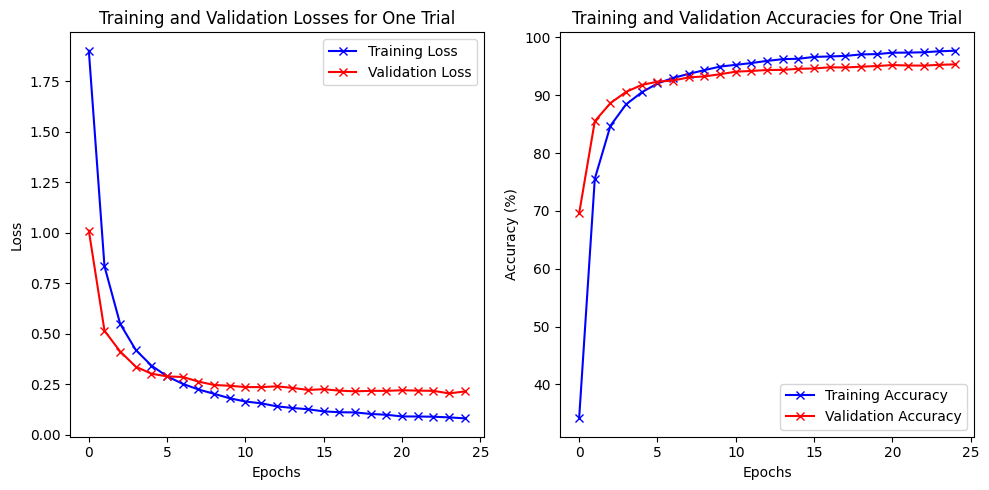

Weights saved successfully!


In [62]:
activation_dict_from_tuning = {
    'ReLU': nn.ReLU(),
    'Tanh': nn.Tanh(),
    'Sigmoid': nn.Sigmoid()
}

get_activation_func = activation_dict_from_tuning.get(study.best_params['activation'], nn.ReLU())  # Default to nn.ReLU if not found

# Load the best model weights
best_model = FCNN(input_size=56 * 28, hidden_layers=study.best_params['hidden_layers'],
                  output_size=19, dropout_rate=study.best_params['dropout_rate'],
                  activation_func=get_activation_func)

# Analyse the learning curve for the best model
best_model.train() 
optimizer_best_model = optim.Adam(best_model.parameters(), lr=study.best_params['learning_rate'])

train_model(best_model, train_loader, val_loader, criterion, optimizer_best_model, epochs)

# Save best_model's weights after training
torch.save(best_model.state_dict(), "trained_best_model_weights.pth")
print("Weights saved successfully!")

In [63]:
reloaded_model = FCNN(input_size=56 * 28, hidden_layers=study.best_params['hidden_layers'],
                      output_size=19, dropout_rate=study.best_params['dropout_rate'],
                      activation_func=get_activation_func)

reloaded_model.load_state_dict(torch.load("trained_best_model_weights.pth"))
reloaded_model.eval()  
print("Model loaded successfully!")

Model loaded successfully!


/var/folders/zx/j5d_p2_s2wz05zg3b78717100000gn/T/ipykernel_51000/2493052559.py:5: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



In [64]:
summary(reloaded_model, (1, 56*28), batch_size=study.best_params['batch_size'])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1               [64, 1, 512]         803,328
              ReLU-2               [64, 1, 512]               0
           Dropout-3               [64, 1, 512]               0
            Linear-4               [64, 1, 256]         131,328
              ReLU-5               [64, 1, 256]               0
           Dropout-6               [64, 1, 256]               0
            Linear-7               [64, 1, 128]          32,896
              ReLU-8               [64, 1, 128]               0
           Dropout-9               [64, 1, 128]               0
           Linear-10                [64, 1, 64]           8,256
             ReLU-11                [64, 1, 64]               0
          Dropout-12                [64, 1, 64]               0
           Linear-13                [64, 1, 19]           1,235
Total params: 977,043
Trainable params:

In [65]:
test_loader_nn = prepare_dataloader(test_image_pair, 
                                    test_label_pair, 
                                    batch_size=study.best_params['batch_size'])

# Accuracy of the best model
test_model(reloaded_model, test_loader)

Test Accuracy: 0.9505


### Visualise confusion matrix

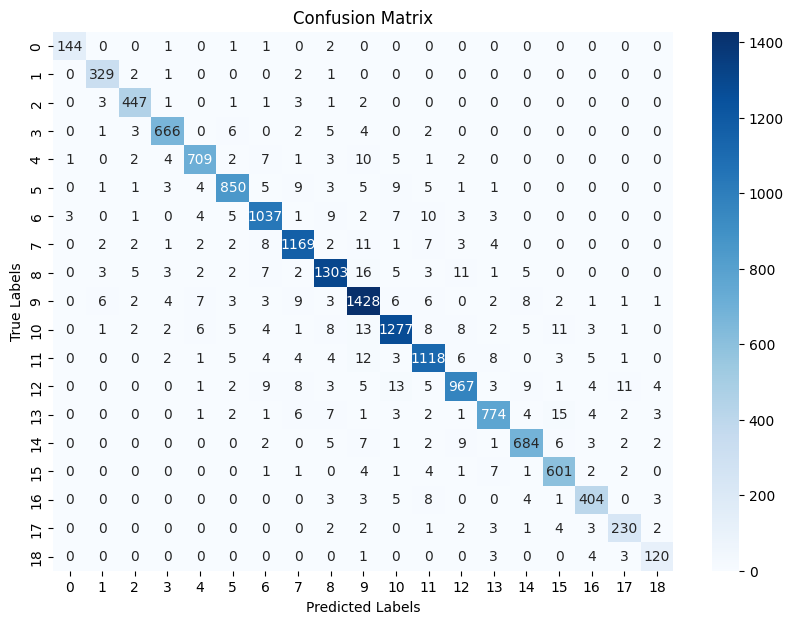

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def confusion_matrix_plot():
    all_preds = []
    all_labels = []

    # Perform inference on the test set
    with torch.no_grad():
        for test_images, test_labels in test_loader_nn:
            outputs = best_model(test_images)
            _, preds = torch.max(outputs, 1)  # Get the predicted class
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(test_labels.cpu().numpy())

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=range(19), yticklabels=range(19))
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()


confusion_matrix_plot()

-----------

# Question 3
> Now, showcase the performance using other inference algorithms implemented in scikit-learn covered in the lectures such as random forest classifiers and support vector machines and compare the performance. Note that you are not required to describe the algorithms in detail.

In [21]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
import numpy as np

## Prepare data

In [22]:
train_images_flat = torch.stack(train_image_pair).view(len(train_image_pair), -1)
train_labels_flat = torch.tensor(train_label_pair)

test_images_flat = torch.stack(test_image_pair).view(len(test_image_pair), -1)
test_labels_flat = torch.tensor(test_label_pair)

# Check the shape
print(train_images_flat.shape)

torch.Size([70000, 1568])


In [23]:
# Reduce dataset size to speed up the process
from sklearn.utils import resample
train_images_flat_small, train_labels_flat_small = resample(
    train_images_flat, train_labels_flat, n_samples=30000, random_state=8
)
test_images_flat_small, test_labels_flat_small = resample(
    test_images_flat, test_labels_flat, n_samples=6000, random_state=8
)

## (i) Random Forest Classifier

In [24]:
def random_forest_view_performance():
    print("Training Random Forest Classifier...")
    rf_clf = RandomForestClassifier(n_estimators=100, random_state=8)
    rf_clf.fit(train_images_flat_small, train_labels_flat_small)
    rf_predictions = rf_clf.predict(test_images_flat_small)

    return rf_predictions

rf_predictions = random_forest_view_performance()

print("Random Forest Classifier Performance:")
print(f"Accuracy: {accuracy_score(test_labels_flat_small, rf_predictions):.4f}")
print(classification_report(test_labels_flat_small, rf_predictions))

Training Random Forest Classifier...
Random Forest Classifier Performance:
Accuracy: 0.6732
              precision    recall  f1-score   support

           0       0.93      0.98      0.95        63
           1       0.84      0.93      0.89       169
           2       0.83      0.86      0.84       165
           3       0.82      0.74      0.78       286
           4       0.76      0.74      0.75       270
           5       0.76      0.71      0.73       372
           6       0.69      0.73      0.71       415
           7       0.74      0.73      0.74       505
           8       0.67      0.71      0.69       560
           9       0.60      0.73      0.66       610
          10       0.59      0.64      0.61       561
          11       0.59      0.63      0.61       450
          12       0.55      0.63      0.59       422
          13       0.60      0.60      0.60       313
          14       0.73      0.47      0.57       286
          15       0.72      0.55      0.62

## (ii) Support Vector Machine (SVM)

In [25]:
def svm_view_performance():
    # Initialize the SVM classifier
    print("Training Support Vector Machine...")
    svm_clf = SVC(kernel='rbf', C=1.0, random_state=42)

    # Use cross_val_score for efficient cross-validation
    print("Performing cross-validation...")
    cv_scores = cross_val_score(svm_clf, train_images_flat_small, train_labels_flat_small, cv=5, n_jobs=-1)

    # Display cross-validation results
    print(f"Cross-validation scores: {cv_scores}")
    print(f"Mean CV Accuracy: {cv_scores.mean():.4f}")

    # Train the SVM on the entire training set and test
    svm_clf.fit(train_images_flat_small, train_labels_flat_small)
    svm_predictions = svm_clf.predict(test_images_flat_small)

    return svm_predictions

svm_predictions = svm_view_performance()

# Display performance metrics
print("Support Vector Machine Performance:")
print(f"Accuracy: {accuracy_score(test_labels_flat_small, svm_predictions):.4f}")
print(classification_report(test_labels_flat_small, svm_predictions))

Training Support Vector Machine...
Performing cross-validation...
Cross-validation scores: [0.72866667 0.736      0.72566667 0.74633333 0.72966667]
Mean CV Accuracy: 0.7333
Support Vector Machine Performance:
Accuracy: 0.6987
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        63
           1       0.85      0.93      0.89       169
           2       0.87      0.91      0.89       165
           3       0.83      0.77      0.80       286
           4       0.80      0.79      0.79       270
           5       0.75      0.74      0.74       372
           6       0.72      0.73      0.73       415
           7       0.72      0.71      0.71       505
           8       0.70      0.68      0.69       560
           9       0.66      0.71      0.68       610
          10       0.65      0.66      0.66       561
          11       0.61      0.69      0.65       450
          12       0.59      0.61      0.60       422
          13     

## (iii) Neural Network Performance (from previous work)

In [49]:
def nn_view_performance():
    reloaded_model.eval()

    nn_preds = []
    nn_labels = []
    with torch.no_grad():
        for images, labels in test_loader_nn:
            outputs = reloaded_model(images)
            _, preds = torch.max(outputs, dim=1)
            nn_preds.extend(preds.cpu().numpy())
            nn_labels.extend(labels.cpu().numpy())
        
    accuracy = accuracy_score(nn_labels, nn_preds)

    return accuracy, nn_preds, nn_labels

accuracy, nn_preds, nn_labels = nn_view_performance()

# Evaluate performance
print("Neural Network Performance:")
print(f"Test Accuracy: {accuracy:.4f}")
print(classification_report(nn_labels, nn_preds))

Neural Network Performance:
Test Accuracy: 0.9524
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       149
           1       0.97      0.97      0.97       335
           2       0.96      0.96      0.96       459
           3       0.98      0.96      0.97       689
           4       0.97      0.95      0.96       747
           5       0.95      0.95      0.95       897
           6       0.95      0.96      0.96      1085
           7       0.95      0.96      0.96      1214
           8       0.96      0.95      0.96      1368
           9       0.95      0.94      0.95      1492
          10       0.95      0.95      0.95      1357
          11       0.94      0.95      0.95      1176
          12       0.95      0.95      0.95      1045
          13       0.95      0.95      0.95       826
          14       0.95      0.96      0.95       724
          15       0.94      0.96      0.95       625
          16       0.94      0.

--------

# Question 4
> Using a weak linear classifier, compare the classifier probabilities for a linear classifier trained on the 56 × 28 dataset with the probabilities of a single linear classifier which is applied on the two images sequentially. How do the performances on the test set compare when trained with few samples (i.e. train with varying number of samples including 50, 100, 500, and 1000 samples respectively).

## Train on a single classifier

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

def prepare_data_for_regression(images, labels):
    images = torch.stack(images)# Converts the list of images into a single PyTorch tensor.
                                # Shape: (num_samples, 1, 56, 28)
    images = images.view(images.size(0), -1) # Flatten images to shape (num_samples, 56*28) to pass it to FCNN
    labels = torch.tensor(labels) # Converts the list of labels into a PyTorch tensor.
                                  # Shape: (num_samples,)
    return images, labels

In [56]:
# Train the model with varying numbers of samples
sample_sizes = [50, 100, 500, 1000, 2000, 5000, 10000]

def train_linear_classifier_on_paired_data(sample_sizes):

    # Flatten 56x28 dataset into 1D
    train_images_regression, train_labels_regression = prepare_data_for_regression(train_image_pair, train_label_pair)
    test_images_regression, test_labels_regression = prepare_data_for_regression(test_image_pair, test_label_pair)

    for size in sample_sizes:
        clf = LogisticRegression()
        clf.fit(train_images_regression[:size], train_labels_regression[:size])
        
        # Predict on the test set
        test_preds_single_classifier = clf.predict(test_images_regression)
        accuracy_single_classifier = accuracy_score(test_labels_regression, test_preds_single_classifier)
        print(f"Classifier accuracy on paired dataset with {size} training samples: {accuracy_single_classifier:.4f}")

train_linear_classifier_on_paired_data(sample_sizes)

Classifier accuracy on paired dataset with 50 training samples: 0.1071
Classifier accuracy on paired dataset with 100 training samples: 0.1158


/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Classifier accuracy on paired dataset with 500 training samples: 0.1222


/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Classifier accuracy on paired dataset with 1000 training samples: 0.1376


/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Classifier accuracy on paired dataset with 2000 training samples: 0.1571


/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Classifier accuracy on paired dataset with 5000 training samples: 0.1676


/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Classifier accuracy on paired dataset with 10000 training samples: 0.1839


## Train two sequential classifiers

Each classifier is trained on one part of the image (top or bottom). However, both classifiers aim to predict the same target lavel: the sum of the digits.

The classifiers do not directly predict the label (the sum). Instead, they contribute to the overall prediction by combining their learned probabilities:
- The first classifier learns patterns that relate the **top part** of the image to the target label;
- The second classifier learns patterns that relate the **bottom part** of the image to the same target label.

The ultimate prediction (the sum) comes from combining the probabilities from both classifiers.

In [53]:
def prepare_mnist_data(dataset):
    image_data = []
    labels = []
    dataset_len = len(dataset)

    for idx in range(dataset_len):
        img, label = dataset[idx]
        image_data.append(img) 
        labels.append(label)
    
    image_data = torch.stack(image_data)# Converts the list of images into a single PyTorch tensor.
                                # Shape: (num_samples, 1, 56, 28)
    image_data = image_data.view(image_data.size(0), -1) # Flatten images to shape (num_samples, 56*28) to pass it to FCNN
    labels = torch.tensor(labels) # Converts the list of labels into a PyTorch tensor.
                                  # Shape: (num_samples,)
    return image_data, labels

In [58]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Combine probabilities for the sum of digits
def combine_digit_probabilities(prob1, prob2):
    combined_probs = np.zeros((prob1.shape[0], 19))  # Sum ranges from 0 to 18
    for i in range(10):
        for j in range(10):
            combined_probs[:, i + j] += prob1[:, i] * prob2[:, j]
    return combined_probs

def train_linear_classifier_on_two_images_sequentially(size):

    ## 1. Train a linear classifier on single MNIST digits
    # Single MNIST images (from original dataset, not paired data)
    train_images_single, train_labels_single = prepare_mnist_data(train_dataset)
    test_images_single, test_labels_single = prepare_mnist_data(test_dataset)

    # Train logistic regression model on single digits
    clf_single = make_pipeline(StandardScaler(), LogisticRegression(max_iter=500))
    clf_single.fit(train_images_single[:size], train_labels_single[:size])

    # Test accuracy on single digits
    test_preds_single = clf_single.predict(test_images_single)
    accuracy_single = accuracy_score(test_labels_single, test_preds_single)
    # print(f"For training size of {size}, Single Digit Classifier Accuracy: {accuracy_single:.4f}")


    ## 2. Evaluate on the test dataset
    test_image_pair_tensor = torch.stack(test_image_pair)  # Shape: (num_samples, 1, 56, 28)

    # Split into top and bottom images
    test_top_images = test_image_pair_tensor[:, :, :28, :]  # Top half (1, 28, 28)
    test_bottom_images = test_image_pair_tensor[:, :, 28:, :]  # Bottom half (1, 28, 28)

    # Flatten the images for input to the classifier
    test_top_images_flat = test_top_images.view(len(test_top_images), -1).numpy()  # Shape: (num_samples, 28*28)
    test_bottom_images_flat = test_bottom_images.view(len(test_bottom_images), -1).numpy()  # Shape: (num_samples, 28*28)

    # Predict probabilities for top and bottom images
    test_top_image_probs = clf_single.predict_proba(test_top_images_flat)
    test_bottom_image_probs = clf_single.predict_proba(test_bottom_images_flat)

    test_combined_probs = combine_digit_probabilities(test_top_image_probs, test_bottom_image_probs)

    # Predict labels based on the highest probability
    test_preds_combined = np.argmax(test_combined_probs, axis=1)

    # Compute accuracy for the training set
    test_label_pair_tensor = torch.tensor(test_label_pair) # test_label_pair is a global object; convert it into a tensor so that it can handle .numpy()
    test_accuracy_combined = np.mean(test_preds_combined == test_label_pair_tensor.numpy())
    
    return test_accuracy_combined

for size in sample_sizes:
    test_accuracy_combined = train_linear_classifier_on_two_images_sequentially(size)
    print(f"For training size of {size}, Sequential Classifier Test Accuracy: {test_accuracy_combined:.4f}")

For training size of 50, Sequential Classifier Test Accuracy: 0.3778
For training size of 100, Sequential Classifier Test Accuracy: 0.4548
For training size of 500, Sequential Classifier Test Accuracy: 0.6851
For training size of 1000, Sequential Classifier Test Accuracy: 0.7227
For training size of 2000, Sequential Classifier Test Accuracy: 0.7482
For training size of 5000, Sequential Classifier Test Accuracy: 0.7925
For training size of 10000, Sequential Classifier Test Accuracy: 0.8178


## Visualise results

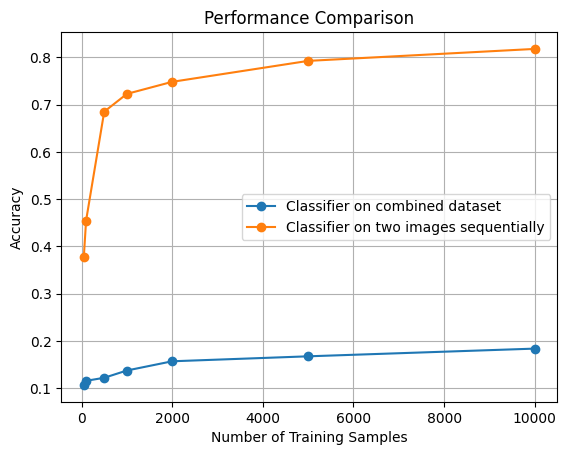

In [ ]:
single_accuracies = [0.1071, 0.1158, 0.1222, 0.1376, 0.1571, 0.1676, 0.1839]  
sequential_accuracies = [0.3778, 0.4548, 0.6851, 0.7227, 0.7482, 0.7925, 0.8178]

plt.plot(sample_sizes, single_accuracies, label="Classifier on combined dataset", marker="o")
plt.plot(sample_sizes, sequential_accuracies, label="Classifier on two images sequentially", marker="o")
plt.xlabel("Number of Training Samples")
plt.ylabel("Accuracy")
plt.title("Performance Comparison")
plt.legend()
plt.grid()
plt.show()

---------

# Question 5
> For your best performing neural network, show the t-SNE distribution of the various classes in the embedding layer (i.e. the layer before the output). Compare this representation with the representation obtained by directly applying t-SNE on the input dataset. You should optimise the perplexity.

## (i) Extract Embeddings from Neural Network

In [42]:
from sklearn.manifold import TSNE

# Define a function to extract embeddings from the penultimate layer (before output)
def get_embeddings(model, dataloader):
    embeddings = []
    labels = []
    model.eval()
    with torch.no_grad():
        for images, target in dataloader:
            # Forward pass through the model to get embeddings 
            output = model.extract_embeddings(images)
            embeddings.append(output.numpy())
            labels.append(target.numpy())
    
    embeddings = np.concatenate(embeddings, axis=0)
    labels = np.concatenate(labels, axis=0)
    return embeddings, labels

# Get embeddings and labels from the test set
embeddings, labels = get_embeddings(reloaded_model, test_loader_nn)

In [43]:
# Range of perplexities to try
perplexity_values = [1, 2, 5, 10, 20, 30, 50, 100]
n_iter = 500  # Number of iterations for t-SNE

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhi

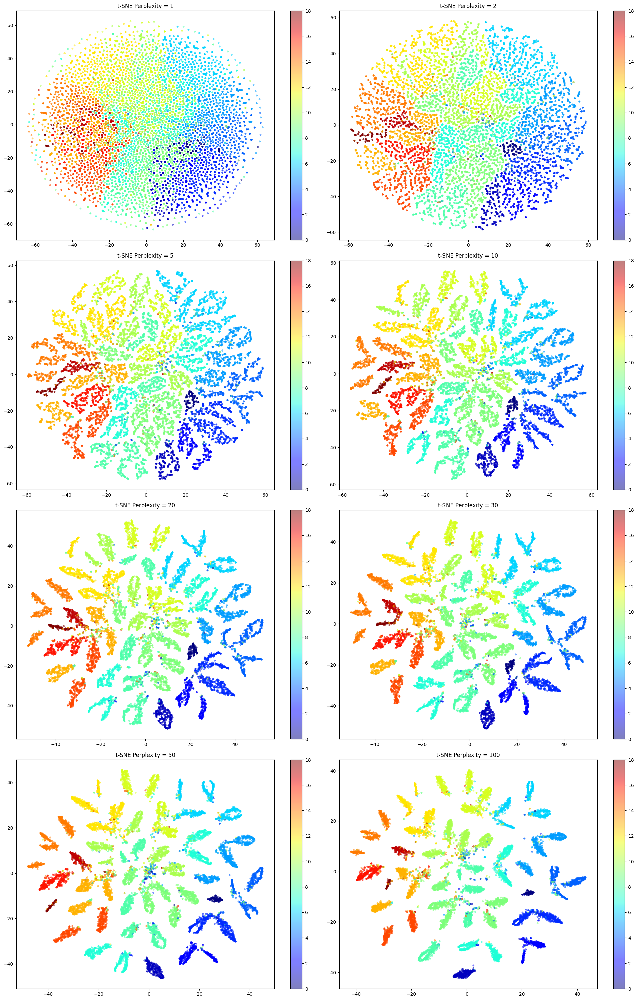

In [ ]:
# Create a plot for each perplexity
plt.figure(figsize=(20, 30))
for i, perplexity in enumerate(perplexity_values, 1):
    tsne_embeddings = TSNE(n_components=2, n_iter=n_iter, perplexity=perplexity, random_state=8)
    tsne_results = tsne_embeddings.fit_transform(embeddings)
    
    plt.subplot(4, 2, i)  # Create subplots (4 rows, 2 columns)
    plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=labels, cmap='jet', alpha=0.5, s=10)
    plt.title(f"t-SNE Perplexity = {perplexity}")
    plt.colorbar()
    
plt.tight_layout()
plt.show()

## (ii) Apply t-SNE directly on input data

In [50]:
# Flatten input images for t-SNE (assuming images are of shape (batch_size, 1, 56, 28))
def flatten_images(dataloader):
    images = []
    labels = []
    with torch.no_grad():
        for batch_images, batch_labels in dataloader:
            images.append(batch_images.view(batch_images.size(0), -1).numpy())  # Flatten images
            labels.append(batch_labels.numpy())
    
    images = np.concatenate(images, axis=0)
    labels = np.concatenate(labels, axis=0)
    return images, labels

# Get flattened images and labels from the test set
flattened_images, _ = flatten_images(test_loader_nn)

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhimeiliu/Downloads/DIS/dis_sheet/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/Users/zhi

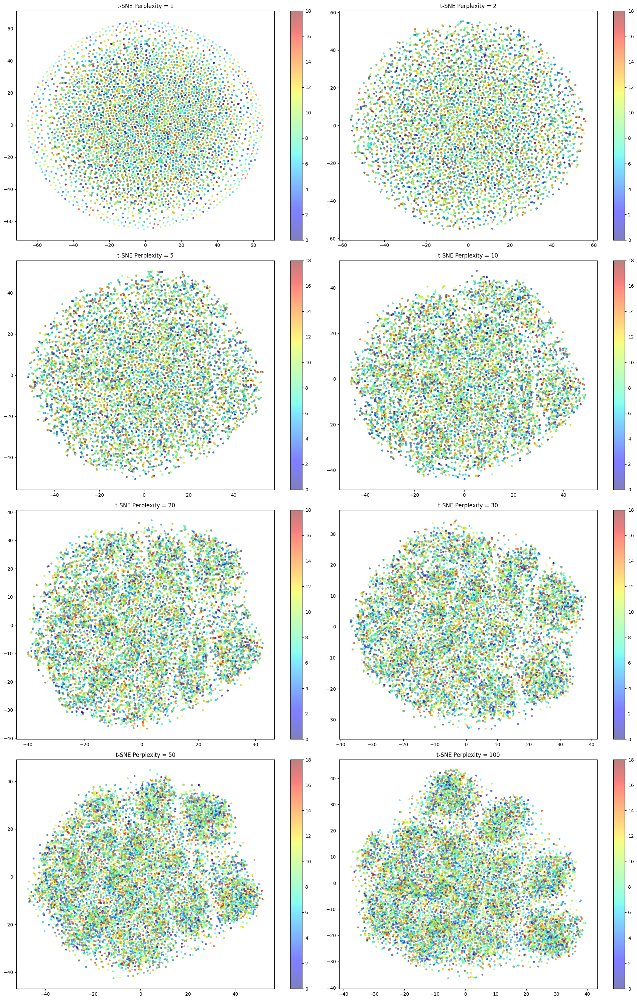

In [ ]:
# Create a plot for each perplexity
plt.figure(figsize=(20, 30))
for i, perplexity in enumerate(perplexity_values, 1):
    tsne_input = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, random_state=8).fit_transform(flattened_images)
    
    plt.subplot(4, 2, i)
    plt.scatter(tsne_input[:, 0], tsne_input[:, 1], c=labels, cmap='jet', alpha=0.5, s=10)
    plt.title(f"t-SNE Perplexity = {perplexity}")
    plt.colorbar()
    
plt.tight_layout()
plt.show()